### Explainability


Regarding the second bullet, you should do at least 3 local plots per model, i.e. explain 3
rows/predictions from your test data and then have one global plot using SHAP.
Regarding bullet three, you should again explain 3 rows/predictions using LIME. Global
plot with LIME is not required.



1. Train at least two advanced models on the energy dataset from TSA_Example notebook. You may choose to use only the last 5 years of the dataset to reduce data size​

2. Explain the patterns the model has learned using SHAP local and global plots​

3. Explain the patterns using LIME​

4. Compare the answers from LIME & SHAP (global & some local) – what do you see? Is it the same?​

In [89]:
import os
import kagglehub
import shap
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
color_pal = sns.color_palette()
plt.style.use('fivethirtyeight')
from IPython.display import display, HTML

import xgboost as xgb
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from lime import lime_tabular

In [90]:
# Download latest version
path = kagglehub.dataset_download("robikscube/hourly-energy-consumption")

print("Path to dataset files:", path)

Path to dataset files: C:\Users\Jlo\.cache\kagglehub\datasets\robikscube\hourly-energy-consumption\versions\3


In [91]:
dataset_path = path

files = os.listdir(dataset_path)
print(files)


['AEP_hourly.csv', 'COMED_hourly.csv', 'DAYTON_hourly.csv', 'DEOK_hourly.csv', 'DOM_hourly.csv', 'DUQ_hourly.csv', 'EKPC_hourly.csv', 'est_hourly.paruqet', 'FE_hourly.csv', 'NI_hourly.csv', 'PJME_hourly.csv', 'PJMW_hourly.csv', 'pjm_hourly_est.csv', 'PJM_Load_hourly.csv']


In [92]:
file_path = path + "/PJME_hourly.csv"

In [93]:
df = pd.read_csv(file_path)

In [94]:
df.head()

,Datetime,PJME_MW
0,2002-12-31 01:00:00,26498.0
1,2002-12-31 02:00:00,25147.0
2,2002-12-31 03:00:00,24574.0
3,2002-12-31 04:00:00,24393.0
4,2002-12-31 05:00:00,24860.0


In [95]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145366 entries, 0 to 145365
Data columns (total 2 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   Datetime  145366 non-null  object 
 1   PJME_MW   145366 non-null  float64
dtypes: float64(1), object(1)
memory usage: 2.2+ MB


In [96]:
df['Datetime'] = pd.to_datetime(df['Datetime'])
df = df.set_index('Datetime')
df = df.sort_index()

In [97]:
df.index.min(), df.index.max()

(Timestamp('2002-01-01 01:00:00'), Timestamp('2018-08-03 00:00:00'))

filter the dataset to only look at the last 5 years in the data set

In [98]:
df_recent = df.loc['2013-08-03':]
print("Recent data shape:", df_recent.shape)
print("Time range:", df_recent.index.min(), "to", df_recent.index.max())

Recent data shape: (43823, 1)
Time range: 2013-08-03 00:00:00 to 2018-08-03 00:00:00


feature engineering on the filtered dataset.

In [99]:
# Now, perform feature engineering on the filtered dataset only:
df_recent['hour'] = df_recent.index.hour
df_recent['day'] = df_recent.index.day
df_recent['month'] = df_recent.index.month
df_recent['dayofweek'] = df_recent.index.dayofweek
df_recent['year'] = df_recent.index.year

# Verify that the new features have been added
print("Columns in filtered data:", df_recent.columns)
print(df_recent.head())

Columns in filtered data: Index(['PJME_MW', 'hour', 'day', 'month', 'dayofweek', 'year'], dtype='object')
                     PJME_MW  hour  day  month  dayofweek  year
Datetime                                                       
2013-08-03 00:00:00  32081.0     0    3      8          5  2013
2013-08-03 01:00:00  29409.0     1    3      8          5  2013
2013-08-03 02:00:00  27455.0     2    3      8          5  2013
2013-08-03 03:00:00  26207.0     3    3      8          5  2013
2013-08-03 04:00:00  25442.0     4    3      8          5  2013


C:\Users\Jlo\AppData\Local\Temp\ipykernel_23584\2073177923.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_recent['hour'] = df_recent.index.hour
C:\Users\Jlo\AppData\Local\Temp\ipykernel_23584\2073177923.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_recent['day'] = df_recent.index.day
C:\Users\Jlo\AppData\Local\Temp\ipykernel_23584\2073177923.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inste

Lets start the preparing for the modeling

train split

In [100]:
TARGET = 'PJME_MW'
X_recent = df_recent.drop(columns=[TARGET])
y_recent = df_recent[TARGET]

In [101]:
train_size = int(0.8 * len(df_recent))
X_train = X_recent.iloc[:train_size]
y_train = y_recent.iloc[:train_size]
X_test = X_recent.iloc[train_size:]
y_test = y_recent.iloc[train_size:]

XGBoost model

In [102]:
dtrain = xgb.DMatrix(X_train, label=y_train)
dtest = xgb.DMatrix(X_test, label=y_test)

params = {
    'objective': 'reg:squarederror',
    'eval_metric': 'rmse',
    'max_depth': 3,
    'learning_rate': 0.01,
    'colsample_bytree': 0.8,
    'subsample': 0.8,
    'seed': 42
}

watchlist = [(dtrain, 'train'), (dtest, 'eval')]
num_round = 2000
early_stopping_rounds = 50

model_xgb = xgb.train(params, dtrain, num_round, watchlist, early_stopping_rounds=early_stopping_rounds, verbose_eval=100)
print("XGBoost best iteration:", model_xgb.best_iteration)

[0]	train-rmse:6358.47627	eval-rmse:6035.51702


c:\Users\Jlo\AppData\Local\Programs\Python\Python313\Lib\site-packages\xgboost\core.py:723: FutureWarning: Pass `evals` as keyword args.
  warnings.warn(msg, FutureWarning)


[100]	train-rmse:4861.53911	eval-rmse:4703.02922
[200]	train-rmse:4193.33260	eval-rmse:4184.46970
[300]	train-rmse:3876.12270	eval-rmse:3972.44393
[400]	train-rmse:3682.60483	eval-rmse:3900.57560
[500]	train-rmse:3561.58032	eval-rmse:3872.34186
[600]	train-rmse:3466.10477	eval-rmse:3857.07753
[700]	train-rmse:3401.62958	eval-rmse:3838.89864
[800]	train-rmse:3347.73734	eval-rmse:3827.23151
[880]	train-rmse:3308.51562	eval-rmse:3834.37680
XGBoost best iteration: 830


RandomForestRegressor

In [103]:
rf_model = RandomForestRegressor(n_estimators=20, random_state=42)
rf_model.fit(X_train, y_train)
print("Random Forest model trained.")

Random Forest model trained.


In [104]:
# Make predictions on the test set
rf_predictions = rf_model.predict(X_test)

# Calculate evaluation metrics
rmse_rf = np.sqrt(mean_squared_error(y_test, rf_predictions))
r2_rf = r2_score(y_test, rf_predictions)

print("Random Forest RMSE:", rmse_rf)
print("Random Forest R²:", r2_rf)


Random Forest RMSE: 4573.754503799994
Random Forest R²: 0.429905438013519


Explain the patterns XGBoost has learned using SHAP local and global plots​

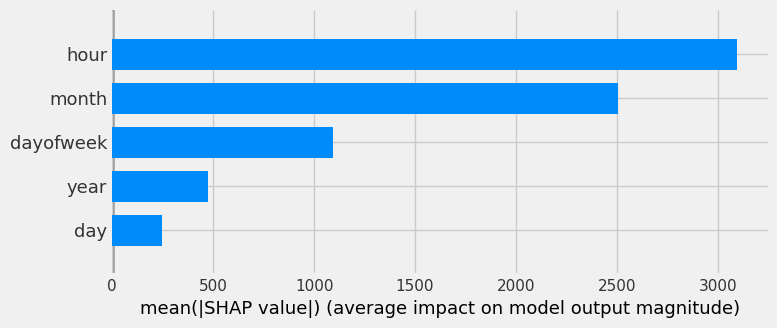

In [105]:
# Create a SHAP explainer for the XGBoost model
explainer_shap_xgb = shap.TreeExplainer(model_xgb)
# Compute SHAP values for the test set
shap_values_xgb = explainer_shap_xgb.shap_values(X_test)

# Global SHAP summary plot (bar plot for clarity)
shap.summary_plot(shap_values_xgb, X_test, plot_type="bar")

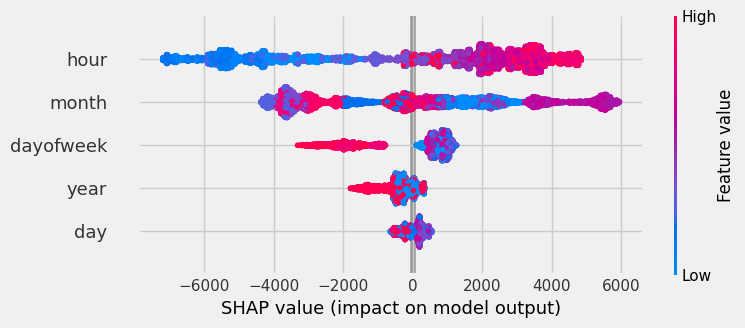

In [106]:
shap.summary_plot(shap_values_xgb, X_test)

XGBoost - Local SHAP Explanation for Test Row 10:
hour            6
day             3
month           8
dayofweek       3
year         2017
Name: 2017-08-03 06:00:00, dtype: int32


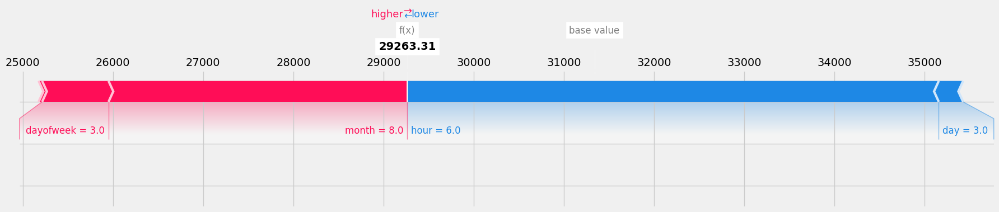

XGBoost - Local SHAP Explanation for Test Row 50:
hour           22
day             4
month           8
dayofweek       4
year         2017
Name: 2017-08-04 22:00:00, dtype: int32


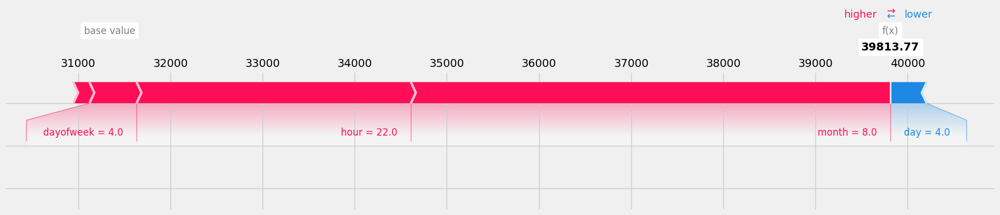

XGBoost - Local SHAP Explanation for Test Row 100:
hour            0
day             7
month           8
dayofweek       0
year         2017
Name: 2017-08-07 00:00:00, dtype: int32


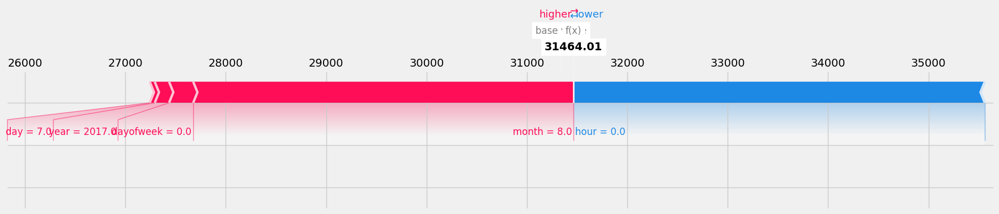

In [107]:
# Choose test row indices for local explanations
local_indices = [10, 50, 100]

for idx in local_indices:
    print(f"XGBoost - Local SHAP Explanation for Test Row {idx}:")
    print(X_test.iloc[idx])
    shap.force_plot(explainer_shap_xgb.expected_value, shap_values_xgb[idx, :], X_test.iloc[idx, :], matplotlib=True)
    plt.show()

RandomForrest

In [108]:
# Create a SHAP explainer for the Random Forest model
explainer_shap_rf = shap.TreeExplainer(rf_model)


i have chosen to sample fewer rows from x test, it was taking a very long time to compute.

In [109]:
X_test_sample = X_test.sample(n=2000, random_state=42)
shap_values_rf = explainer_shap_rf.shap_values(X_test_sample)


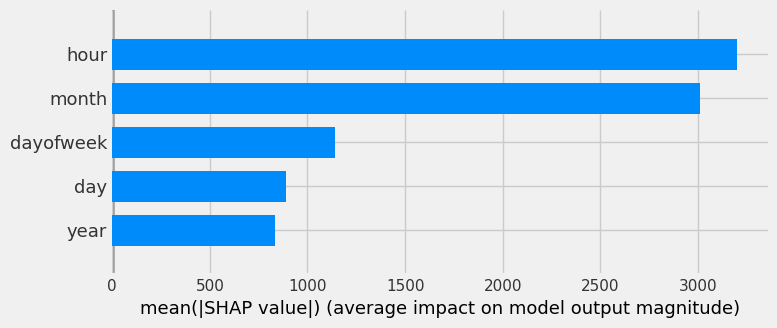

In [110]:
# Global SHAP summary plot (bar plot)
shap.summary_plot(shap_values_rf, X_test_sample, plot_type="bar")

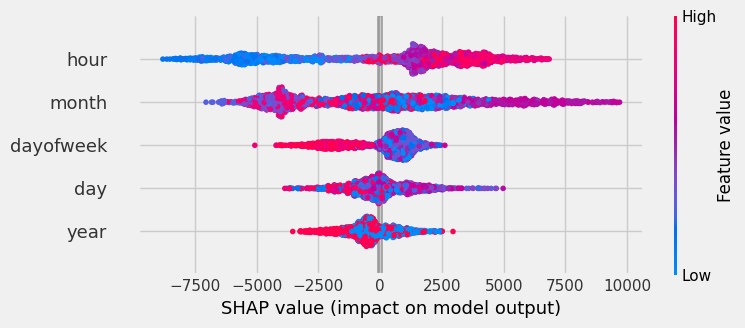

In [111]:
shap.summary_plot(shap_values_rf, X_test_sample)

Random Forest - Local SHAP Explanations:
Test Row 10:
hour            6
day             3
month           8
dayofweek       3
year         2017
Name: 2017-08-03 06:00:00, dtype: int32


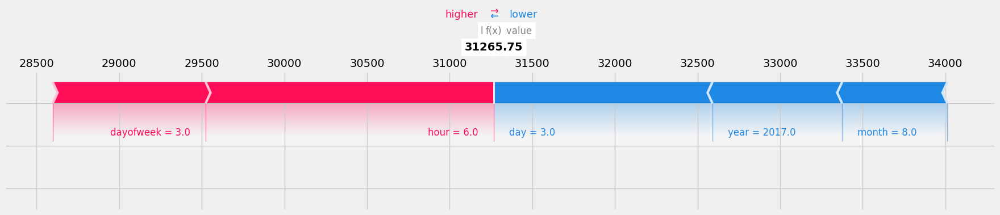

Test Row 50:
hour           22
day             4
month           8
dayofweek       4
year         2017
Name: 2017-08-04 22:00:00, dtype: int32


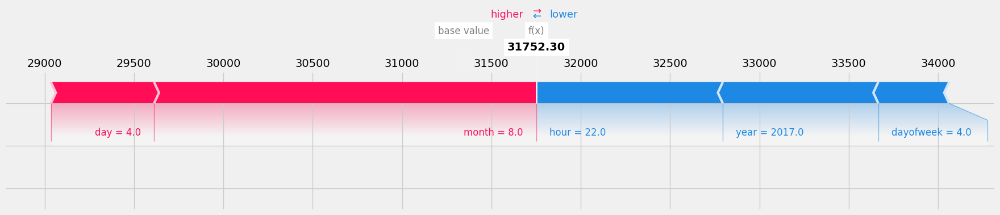

Test Row 100:
hour            0
day             7
month           8
dayofweek       0
year         2017
Name: 2017-08-07 00:00:00, dtype: int32


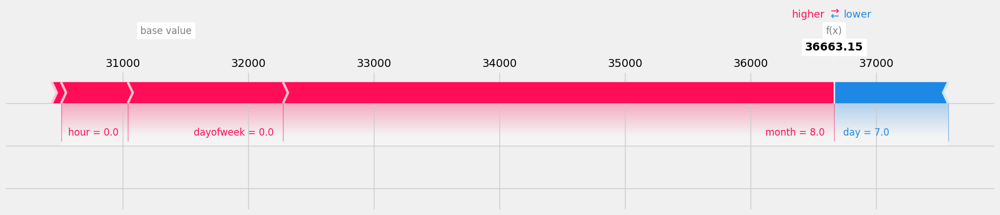

In [112]:
local_indices = [10, 50, 100]

print("Random Forest - Local SHAP Explanations:")
for idx in local_indices:
    print(f"Test Row {idx}:")
    print(X_test.iloc[idx])
    shap.force_plot(explainer_shap_rf.expected_value, shap_values_rf[idx, :], X_test.iloc[idx, :], matplotlib=True)
    plt.show()

3. Explain the patterns using LIME​


Lime for XGBoost

In [113]:
def predict_fn(x):
    dmatrix = xgb.DMatrix(x, feature_names=list(X_train.columns))
    return model_xgb.predict(dmatrix)


In [114]:
explainer_lime_xgb = lime_tabular.LimeTabularExplainer(
    X_train.values,
    feature_names=X_train.columns,
    mode='regression'
)

In [115]:
for idx in local_indices:
    exp = explainer_lime_xgb.explain_instance(X_test.values[idx], predict_fn, num_features=10)
    print(f"XGBoost - Local LIME Explanation for Test Row {idx}:")
    print(exp.as_list())
    # Instead of exp.show_in_notebook(), use display(HTML(...))
    display(HTML(exp.as_html(show_table=True)))

XGBoost - Local LIME Explanation for Test Row 10:
[('hour <= 6.00', -7335.876724382273), ('7.00 < month <= 10.00', 2640.5761776878994), ('year > 2016.00', -877.2896836998411), ('1.00 < dayofweek <= 3.00', 789.0722757453278), ('day <= 8.00', -97.28608995963293)]


XGBoost - Local LIME Explanation for Test Row 50:
[('hour > 17.00', 4806.782749178412), ('7.00 < month <= 10.00', 2733.432774268888), ('year > 2016.00', -766.639783029286), ('3.00 < dayofweek <= 5.00', 580.876576521109), ('day <= 8.00', 34.02790988078978)]


XGBoost - Local LIME Explanation for Test Row 100:
[('hour <= 6.00', -7658.425691989872), ('7.00 < month <= 10.00', 2549.693744349728), ('year > 2016.00', -872.8819953678054), ('dayofweek <= 1.00', 494.3312633243371), ('day <= 8.00', -21.525589303204754)]


Random forest Lime.

In [116]:
# Create a LIME explainer for Random Forest using the training data
explainer_lime_rf = lime_tabular.LimeTabularExplainer(
    X_train.values,
    feature_names=list(X_train.columns),
    mode='regression'
)

# Define a simple prediction function for the Random Forest model
def predict_fn_rf(x):
    return rf_model.predict(x)

print("Random Forest - Local LIME Explanations:")
for idx in local_indices:
    exp = explainer_lime_rf.explain_instance(X_test.values[idx], predict_fn_rf, num_features=10)
    print(f"Test Row {idx}:")
    print(exp.as_list())
    display(HTML(exp.as_html(show_table=True)))

Random Forest - Local LIME Explanations:
Test Row 10:
[('hour <= 6.00', -8004.53935445806), ('1.00 < dayofweek <= 3.00', 1108.5987368856731), ('year > 2016.00', -1001.7902091248185), ('7.00 < month <= 10.00', 547.6103117534209), ('day <= 8.00', -34.43557423996146)]


c:\Users\Jlo\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


c:\Users\Jlo\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


Test Row 50:
[('hour > 17.00', 4968.4379947193875), ('year > 2016.00', -829.1011226448617), ('3.00 < dayofweek <= 5.00', -807.7301609879927), ('7.00 < month <= 10.00', 648.5591526985381), ('day <= 8.00', -0.23772052169103433)]


Test Row 100:
[('hour <= 6.00', -7905.872918568208), ('dayofweek <= 1.00', 1262.2852109563107), ('year > 2016.00', -872.0375775251404), ('day <= 8.00', -83.34010257380525), ('7.00 < month <= 10.00', 21.982114509947234)]


c:\Users\Jlo\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


### 4. Compare the answers from LIME & SHAP (global & some local) – what do you see? Is it the same?​

So lets start with comparing the global SHAP bar plots.

Note: For the Random Forest, I reduced tree complexity and sampled the test set to manage computation time when generating SHAP values. This might skew its global SHAP results if the sample isn’t fully representative.

Both models agree that hour is the most influential feature for predicting energy usage, reflecting strong diurnal patterns. Month consistently ranks second, suggesting seasonal or monthly effects play a major role. Meanwhile, dayofweek and year swap positions between the two models, indicating slight differences in how they capture weekly vs. yearly trends. Finally, day has a smaller impact overall.